<a href="https://colab.research.google.com/github/acse-moj20/msc-irp/blob/dev/PredGAN/PredGAN_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Dev Code (PredGAN) For Fluid Problem** 

General Specs:
- POD Coefficients: 292
- GAN Architecture 
  - generator: Modified. Additional conv2dT layer and filter size.
  - disciriminator: Modified. 2 additional conv2d layers. 
- Learning_rate: 1e-4
- number generated: 5
- Batch_size: 256
- Epochs: 50,000

**Version: A300**
- Latent space: 300
- ntimes: 21; steps: 1

**Version: B300**
- Latent space: 300
- ntimes: 21; steps: 2





Setup and package import

In [35]:
%matplotlib inline
import sys
import os
import sklearn
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import joblib
import time
import functools


mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

In [36]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


# Processing Power and Available Memory

GPU Specs

In [37]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('GPU info not found.')
else:
  print(gpu_info)

print('Num of available GPUs: ', len(tf.config.list_physical_devices('GPU')))

Mon Aug  2 13:54:14 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    34W / 250W |   4641MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Memory Allocation

In [38]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM



#Utility Functions

In [39]:
## UTILITY FUNCTIONS FOR VISUALIZATION AND ERROR MEASUREMENT

def calculate_error(data, data_recovered):
  abs_error = abs(data - data_recovered)
  perc_error = abs_error*100/abs(data)

  return np.max(abs_error), np.mean(abs_error)

def plot_vortex(data, times, cols, rows=1):
  fig, ax = plt.subplots(rows, cols, figsize=[20, 5*cols])
  
  for i, step in enumerate(times):
    im = ax.flatten()[i].imshow(data[step], cmap='RdBu')
    cbar = plt.colorbar(im, ax=ax.flatten()[i], shrink=0.25, pad=0.05, panchor=(0.0, 0.0))    
    ax.flatten()[i].set_title('t = {}'.format(step), y=1.05, 
                          fontsize=16, fontweight="bold")
  plt.show()


def concat_timesteps(X_train, ntimes, step, window_start, window_end):
    X_train_concat = []
    for start, end in zip(window_start, window_end):
      for i in range(start, end+step): 
        X_train_concat.append(X_train[i:i+ntimes*step:step])
        # print('sample starts from {} :'.format(i))
        # for j in range(i, i+ntimes*step, step):
        #   print('{}'.format(j) , end=', ')
        # print('\n')
    return np.array(X_train_concat)

def invert_data(X_data):
  X_scale_inverted = scaler.inverse_transform(X_data)
  X_pca_inverted = pca.inverse_transform(X_scale_inverted)
  return X_pca_inverted

def transform_data(X_data):
  X_pca = pca.fit_transform(X_data)
  X_pca_scaled = scaler.fit_transform(X_pca)
  return X_pca_scaled

# Model Reduction

##**Data Details**

What we know so far:


*   Dataset represents the parameter values of u, v and p for 100 separate examples of the high fidelity solution.
*   Each example is computed over 50 timesteps and a on a 256-by-256 grid.

*   Vorticity over the vector field is obatined by computing the curl of u (x-component velocity vector) and v (y-component velocity vector)






##**Raw data transformation**

**Get Data from Drive and transform**

To be run only once

In [ ]:
# data_dir = 'drive/MyDrive/MSC_IRP/data/vortex_100.npy'

# # Load x and y velocity components.
# data_file = np.load(data_dir)

# print('Size of dataset:         ', data_file.shape)
# print('Number of data samples:  ', len(data_file))
# print('Size of each sample:     ', data_file[0].shape)
# print('Number of time steps:    ', len(data_file[0]))

Size of dataset:          (100, 50, 256, 256, 3)
Number of data samples:   100
Size of each sample:      (50, 256, 256, 3)
Number of time steps:     50


In [ ]:

# # Data transformation - computing vorticity from vector field.
# # vorticity is the curl of the velocity vector field (raw dataset).

# def curl(u,v):
#   """ 
#   Function to calculate the curl of a 2-dimensional vector field.
#   Parameters:
#   -----------
#     u : 2d array of size n*m
#       vector component in the x direction.

#     v : 2d array of size n*m
#       vector component in the y direction
#   Output:
#   -------
#     curl : 2d array of size n*m
#       curl of vector field [i.e. (dv/dx)i - (du/dy)j]
#   """
#   curl = np.gradient(v)[0] - np.gradient(u)[1]
#   return curl


**Save Transformed Data to Drive**

To be run only once

In [ ]:
# Compute and save vorticity for easier data loading

# vorticity = np.zeros((100, 50, 256, 256))
# for i in range(len(data_file)):
#  for j in range(len(data_file[0])):
#    vorticity[i][j] = curl(data_file[i][j][:, :, 0], data_file[i][j][:, :, 1])
# save_dir = 'drive/MyDrive/MSC_IRP/data/calc_vortex_100.npy'
# np.save(save_dir, vorticity)

##**Dataset visualization**

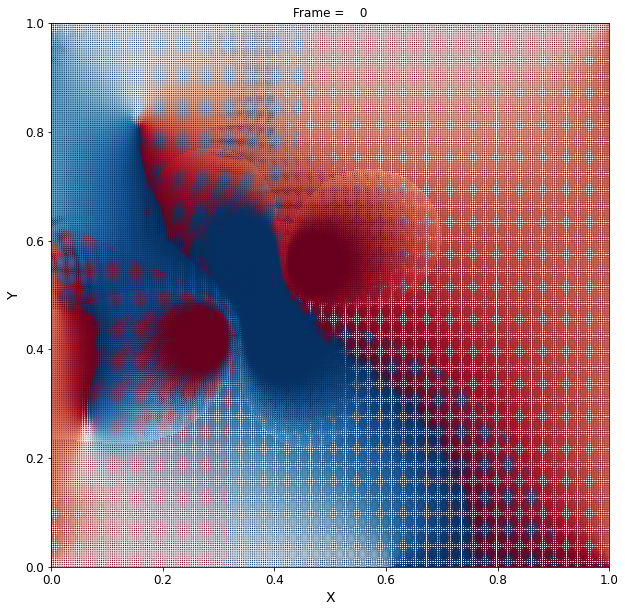

In [ ]:
import seaborn as sns
from matplotlib import animation

# # create a figure and axes
# fig, ax = plt.subplots(1,2, figsize=(12,5))

# ax[0].set_xlim((0,1))
# ax[0].set_ylim((0,1))
# ax[0].set_xlabel('X')
# ax[0].set_ylabel('Y')
# ax[0].set_title('X-Velocity vs. time')

# ax[1].set_xlim((0,1))
# ax[1].set_ylim((0,1))
# ax[1].set_xlabel('X')
# ax[1].set_ylabel('Y')
# ax[1].set_title('Y-Velocity vs. time')
# txt_title = ax[1].set_title('')
# line1 = ax[0].imshow(data[0][:, :, 0])     # ax.plot returns a list of 2D line objects
# line2 = ax[1].imshow(data[0][:, :, 1])

fig, ax= plt.subplots(figsize=(10,10))
ax.set_xlim((0,1))
ax.set_ylim((0,1))
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('Y-Velocity vs. time')
txt_title = ax.set_title('')

def drawframe(n):

    x,y = np.meshgrid(np.linspace(0,1,256),np.linspace(0,1,256))
    plot = plt.quiver(x, y, data[n][:, :, 0], data[n][:, :, 1], 
                      np.arctan2(data[n][:, :, 0], data[n][:, :, 1]),
                      angles='xy', cmap='RdBu')
    # line1 = plt.imshow(data[n][:, :, 0])
    # line2 = plt.imshow(data[n][:, :, 1])
    txt_title.set_text('Frame = {0:4d}'.format(n))
    return (plot.U, plot.V)

txt_title.set_text('Frame = {0:4d}'.format(25))
anim = animation.FuncAnimation(fig, drawframe, frames=49, interval=200)
from IPython.display import HTML
HTML(anim.to_html5_video())

# x,y = np.meshgrid(np.linspace(0,1,256),np.linspace(0,1,256))

# plt.quiver(x, y, data[10][:, :, 0], data[10][:, :, 1], np.arcsin(data[10][:, :, 0], data[10][:, :, 1],), angles='xy', scale_units='xy', scale=1,color='r')
# plt.show()

# x,y = np.meshgrid(np.linspace(0,1,256),np.linspace(0,1,256))
# plt.quiver(x, y, data[35][:, :, 0], data[35][:, :, 1], np.arcsin(data[35][:, :, 0], data[35][:, :, 1],), angles='xy', scale_units='xy', scale=1,color='r')
# plt.show()

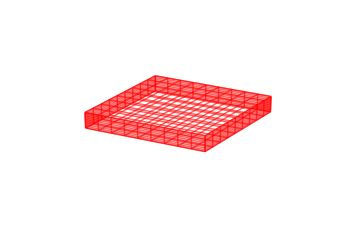

In [ ]:
# from mpl_toolkits.mplot3d import Axes3D
# import matplotlib.pyplot as plt
# import numpy as np
# from itertools import product, combinations


# fig = plt.figure()
# ax = fig.gca(projection='3d')


# # draw cube
# r = [-1, 0]
# for s, e in combinations(np.array(list(product(r, r, r))), 2):
#     if np.sum(np.abs(s-e)) == r[1]-r[0]:
#         ax.plot3D(*zip(s, e), color="b")
# r = [1, 1]
# for s, e in combinations(np.array(list(product(r, r, r))), 2):
#     if np.sum(np.abs(s-e)) == r[1]-r[0]:
#         ax.plot3D(*zip(s, e), color="b")
# # make the panes transparent
# ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# # make the grid lines transparent
# ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
# ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
# ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
# ax.set_axis_off()
# plt.show()





# def plot_cuboid(center, size):
#     """
#        Create a data array for cuboid plotting.


#        ============= ================================================
#        Argument      Description
#        ============= ================================================
#        center        center of the cuboid, triple
#        size          size of the cuboid, triple, (x_length,y_width,z_height)
#        :type size: tuple, numpy.array, list
#        :param size: size of the cuboid, triple, (x_length,y_width,z_height)
#        :type center: tuple, numpy.array, list
#        :param center: center of the cuboid, triple, (x,y,z)
#    """
#     # suppose axis direction: x: to left; y: to inside; z: to upper
#     # get the (left, outside, bottom) point
#     import numpy as np
#     ox, oy, oz = center
#     l, w, h = size

#     x = np.linspace(ox-l/2,ox+l/2,num=10)
#     y = np.linspace(oy-w/2,oy+w/2,num=10)
#     z = np.linspace(oz-h/2,oz+h/2,num=10)
#     x1, z1 = np.meshgrid(x, z)
#     y11 = np.ones_like(x1)*(oy-w/2)
#     y12 = np.ones_like(x1)*(oy+w/2)
#     x2, y2 = np.meshgrid(x, y)
#     z21 = np.ones_like(x2)*(oz-h/2)
#     z22 = np.ones_like(x2)*(oz+h/2)
#     y3, z3 = np.meshgrid(y, z)
#     x31 = np.ones_like(y3)*(ox-l/2)
#     x32 = np.ones_like(y3)*(ox+l/2)

#     from mpl_toolkits.mplot3d import Axes3D
#     import matplotlib.pyplot as plt
#     fig = plt.figure()
#     ax = fig.gca(projection='3d')
#     # outside surface
#     ax.plot_wireframe(x1, y11, z1, color='r', rstride=1, cstride=1, alpha=0.6)
#     # inside surface
#     ax.plot_wireframe(x1, y12, z1, color='r', rstride=1, cstride=1, alpha=0.6)
#     # bottom surface
#     ax.plot_wireframe(x2, y2, z21, color='r', rstride=1, cstride=1, alpha=0.6)
#     # upper surface
#     ax.plot_wireframe(x2, y2, z22, color='r', rstride=1, cstride=1, alpha=0.6)
#     # left surface
#     ax.plot_wireframe(x31, y3, z3, color='r', rstride=1, cstride=1, alpha=0.6)
#     # right surface
#     ax.plot_wireframe(x32, y3, z3, color='r', rstride=1, cstride=1, alpha=0.6)
#     ax.set_xlabel('X')
#     ax.set_xlim(-100, 100)
#     ax.set_ylabel('Y')
#     ax.set_ylim(-100, 100)
#     ax.set_zlabel('Z')
#     ax.set_zlim(-100, 100)
#     # make the panes transparent
#     ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
#     ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
#     ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
#     # make the grid lines transparent
#     ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
#     ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
#     ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
#     ax.set_axis_off()
#     plt.show()



# def test():
#     center = [0, 0, 0]
#     length = 50 * 3
#     width = 50 * 3
#     height = 3 * 10
#     plot_cuboid(center, (length, width, height))
# test()

##**Dimensionality reduction - PCA**

The training dataset will consist of 100 samples of a high-fidelity numerical simulation each with 50 evenly sampled snapshots (in time). Each simulation represents velocity (in x and y directions) and pressure for the turbulent flow model over a region of grid size 256x256. These values can be used to generate a vorticity field for the model. Thus, there is a total number of 256 * 256 = 65,536 variables per time step and a total of 50 * 100 = 5,000 samples. Dimensionality reduction of this high dimensional space is then performed using Principal Component Analysis (PCA) in order to work with a relatively low dimension space

###Load Data

In [ ]:
# Load vortex data as traing data.
X_train3d = np.load('drive/MyDrive/MSC_IRP/data/calc_vortex_100.npy')

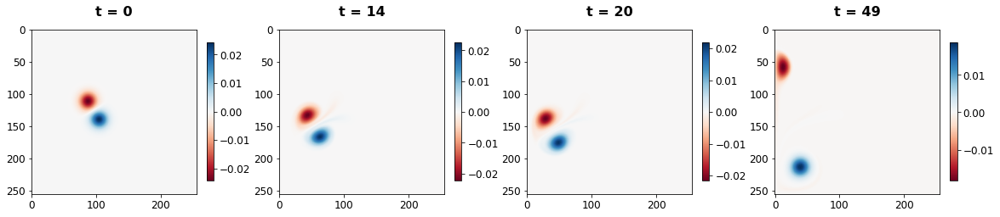

In [ ]:
times = [0, 14, 20, 49]
plot_vortex(X_train3d[58], times, 4)

In [ ]:
nx = len(X_train3d[0][0])
timestep = len(X_train3d[0])
X_train3d.shape

(100, 50, 256, 256)

###Build PCA Model

This PCA model is built using the 292 components that gave > 99.9% variance in the reduction.

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

normalize = False # flag to normalize training data before PCA or not.
X_train1d = X_train3d.reshape((-1, nx*nx))
print(X_train1d.shape)

# Normalization
if(normalize):
  X_train1d = StandardScaler().fit_transform(X_train1d)

# Initiate PCA
pca = PCA(X_train1d.shape[0])
X_train_pca = pca.fit_transform(X_train1d)

(5000, 65536)


KeyboardInterrupt: ignored

In [ ]:
X_recovered_1d = pca.inverse_transform(X_train_pca)
np.allclose(X_recovered_1d, X_train1d)

True

In [ ]:
p = 0.999
cumsum_eig = np.cumsum(pca.explained_variance_ratio_)
n_components_eig = np.argmax(cumsum_eig >= p) + 1 # returns the indices of the maximum values along an axis.
n_components_eig

292

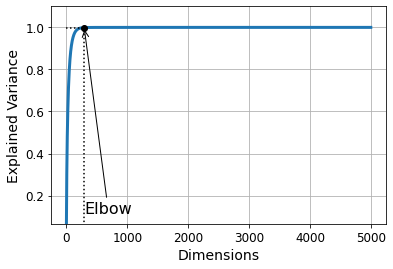

In [ ]:
plt.figure(figsize=(6,4))
plt.plot(cumsum_eig, linewidth=3)
plt.xlabel("Dimensions")
plt.ylabel("Explained Variance")
plt.ylim([cumsum_eig[0],1.1])
plt.plot([n_components_eig, n_components_eig], [0, p], "k:")
plt.plot([0, n_components_eig], [p, p], "k:")
plt.plot(n_components_eig, p, "ko")
plt.annotate("Elbow", xy=(n_components_eig, p), xytext=(n_components_eig, cumsum_eig[0]+0.05),
             arrowprops=dict(arrowstyle="->"), fontsize=16)
plt.grid(True)
plt.show()

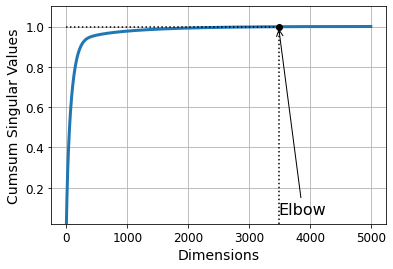

In [ ]:
p = 0.999
cumsum_sv = np.cumsum(pca.singular_values_/sum(pca.singular_values_))
n_components_sv = np.argmax(cumsum_sv >= p) + 1

d = n_components_sv
plt.figure(figsize=(6,4))
plt.plot(cumsum_sv, linewidth=3)
plt.xlabel("Dimensions")
plt.ylabel("Cumsum Singular Values")
plt.ylim([cumsum_sv[0],1.1])
plt.plot([d, d], [0, p], "k:")
plt.plot([0, d], [p, p], "k:")
plt.plot(d, p, "ko")
plt.annotate("Elbow", xy=(d, p), xytext=(d, cumsum_sv[0]+0.05),
             arrowprops=dict(arrowstyle="->"), fontsize=16)
plt.grid(True)
plt.show()
print(d)

In [ ]:
pca_rom = PCA(n_components=n_components_eig)
X_train_pca = pca_rom.fit_transform(X_train1d)
X_reconstruct = pca_rom.inverse_transform(X_train_pca)
print(X_train_pca.shape)
np.allclose(X_reconstruct, X_train1d)

(5000, 292)


False

In [ ]:
# Comparing actual data and pca reduced data
actual_data = X_train1d.reshape((-1, timestep, nx, nx))[89]
recon_data = X_reconstruct.reshape((-1, timestep, nx, nx))[89]

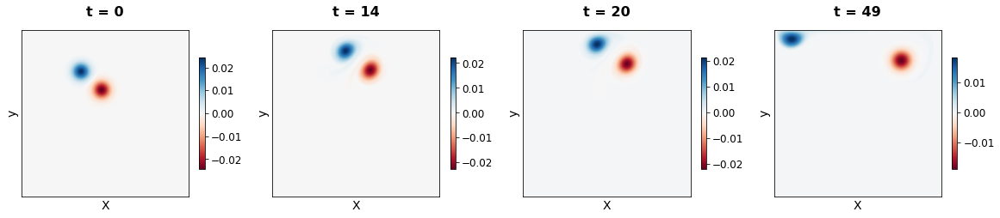

In [ ]:
plot_vortex(actual_data, times)

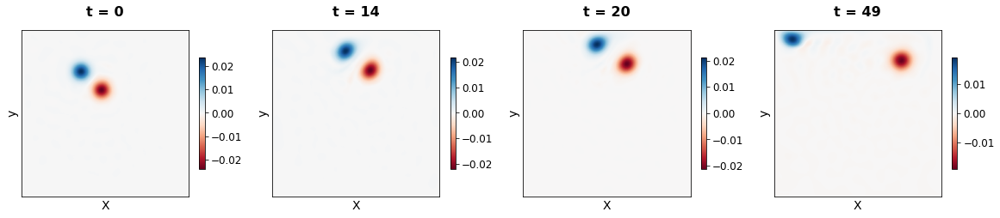

In [ ]:
plot_vortex(recon_data, times)

###Calculate Error

In [ ]:
max_abs_err, mean_abs_err = calculate_error(actual_data, recon_data)
print("Max. abs. error: {}". format(max_abs_err))
print("Mean abs. error: {}".format(mean_abs_err))

Max. abs. error: 0.0026068006677143927
Mean abs. error: 5.0103895884519914e-05


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in true_divide
  """


###Save PCA model

In [ ]:
import joblib
pca_file_dir = "drive/MyDrive/MSC_IRP/PredGAN/pca_rom_292.pkl"
with open(pca_file_dir, 'wb') as save_file:  
  joblib.dump(pca_rom, save_file)
#np.save('drive/MyDrive/MSC_IRP/data/pca_calc_vortex_100.npy', X_train_pca)

#Training Prediction GAN

Following reduction in dimension, we can now proceed to train a GAN for prediction.

###Load Data

In [40]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

SAVE_DIR = 'drive/MyDrive/MSC_IRP/PredGAN/'

nx = 256 # len(X_train3d[0][0])
timestep = 50 # len(X_train3d[0])

print (nx)
print(timestep)

256
50


**CONFIG SETTINGS.**

In [41]:
normalize = False # flag to normalize training data before PCA or not.
mem_load = True
num_of_coeff = 292
ntimes = 7 # Consecutive times for the GAN
step = 5 # step between times


g_lr = 1e-4
d_lr = 1e-4
num_examples_to_generate = 15

BATCH_SIZE = 16
latent_space = 3000

# Seed and intitialization
seed = tf.random.normal([num_examples_to_generate, latent_space])

In [42]:
if (mem_load):
  pca = joblib.load('drive/MyDrive/MSC_IRP/PredGAN/pca_rom_292.pkl')
  X_train1d_pca = np.load('drive/MyDrive/MSC_IRP/data/pca_calc_vortex_100.npy')
else: 
  # Load vortex data as traing data.
  X_train3d = np.load('drive/MyDrive/MSC_IRP/data/calc_vortex_100.npy')
  X_train1d = X_train3d.reshape((-1, nx*nx))
  if (normalize):
    X_train1d = StandardScaler().fit_transform(X_train1d)
  # 
  pca = PCA(num_of_coeff)
  X_train1d_pca = pca.fit_transform(X_train1d)
print(X_train1d_pca.shape)

(5000, 292)


In [43]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train1d_pca_scaled = scaler.fit_transform(X_train1d_pca)
np.allclose(X_train1d_pca, scaler.inverse_transform((X_train1d_pca_scaled)))


True

###Visualize Data

In [10]:
times = [0, 14, 20, 49]
plot_vortex(X_train3d[69], times, len(times))

NameError: ignored

In [ ]:
# Inverse PCA plots
X_recovered = pca.inverse_transform(X_train1d_pca).reshape(-1,timestep, nx, nx)
print(X_recovered.shape)
plot_vortex(X_recovered[69], times, len(times))

In [ ]:
# Inverse scaling and inverse PCA plots
X_recovered = invert_data(X_train1d_pca_scaled).reshape(-1,timestep, nx, nx)
print(X_recovered.shape)
plot_vortex(X_recovered[69], times, len(times))

### Time series Concatenation

In [44]:
sample_size = 100 # X_train3d.shape[0] #100 separate samples
window_start = [(sample*timestep)for sample in range(sample_size)]
window_end = [(sample*timestep) - (ntimes*step) for sample in range(1, sample_size + 1)]


X_train_concat = concat_timesteps(X_train1d_pca_scaled, ntimes, step, window_start, window_end)
X_train_concat_flatten = X_train_concat.reshape(X_train_concat.shape[0], num_of_coeff*ntimes)
print(X_train_concat.shape)
print(X_train_concat_flatten.shape)

(2000, 7, 292)
(2000, 2044)


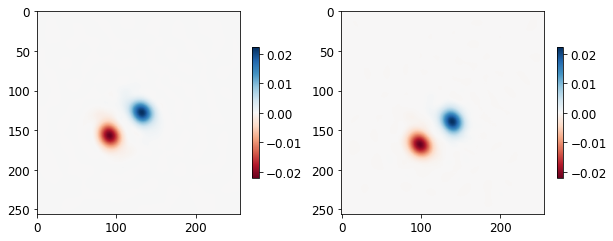

(7, 65536)


In [12]:
# Reverse transform concatenated series to check correctness
fig, ax = plt.subplots(1, 2, figsize=[10,10])
X_ = invert_data(X_train_concat[69, :, :])
im = ax[0].imshow(X_[0,:].reshape(nx, nx), cmap='RdBu')
im = ax[1].imshow(X_[1, :].reshape(nx, nx), cmap='RdBu')
fig.colorbar(im, ax=ax.flatten()[0], shrink=0.24, pad=0.05, panchor=(0.0, 0.0))
fig.colorbar(im, ax=ax.flatten()[1], shrink=0.24, pad=0.05, panchor=(0.0, 0.0))
plt.show()
print(X_.shape)

Dataset Creation

In [45]:
# Create a tensorflow dataset and split it into batches
train_dataset = X_train_concat.reshape(X_train_concat.shape[0], ntimes, num_of_coeff, 1).astype('float32')
train_dataset = tf.data.Dataset.from_tensor_slices(train_dataset)
train_dataset = train_dataset.shuffle(len(X_train_concat)).batch(BATCH_SIZE)

### W-GAN with GP 


Generator Model

In [46]:
def make_generator_model():
    # model = tf.keras.Sequential()
    # model.add(tf.keras.layers.Dense(5*73*256, use_bias=False, input_shape=(latent_space,)))
    # model.add(tf.keras.layers.BatchNormalization())
    # model.add(tf.keras.layers.LeakyReLU())

    # model.add(tf.keras.layers.Reshape((5, 73, 256)))

    # model.add(tf.keras.layers.Conv2DTranspose(128, (3, 3), strides=(1, 1), padding='same', use_bias=False))
    # model.add(tf.keras.layers.BatchNormalization())
    # model.add(tf.keras.layers.LeakyReLU())

    # model.add(tf.keras.layers.Conv2DTranspose(64, (3, 3), strides=(1, 2), padding='same', use_bias=False))
    # model.add(tf.keras.layers.BatchNormalization())
    # model.add(tf.keras.layers.LeakyReLU())

    # model.add(tf.keras.layers.Conv2DTranspose(1, (3, 3), strides=(1, 2), padding='valid', use_bias=False, activation='tanh'))
    
    #weight initialization
    init = tf.initializers.RandomNormal(stddev=0.02)
  
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Dense(5*12*512, use_bias=False, input_shape=(latent_space,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU(0.3))
  

    model.add(tf.keras.layers.Reshape((5, 12, 512)))

    model.add(tf.keras.layers.Conv2DTranspose(256, (3, 7), strides=(1, 1), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU(0.3)) 

    model.add(tf.keras.layers.Conv2DTranspose(128, (3, 7), strides=(1, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU(0.3))

    model.add(tf.keras.layers.Conv2DTranspose(64, (3, 7), strides=(1, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU(0.3))

    model.add(tf.keras.layers.Conv2DTranspose(32, (3, 7), strides=(1, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU(0.3))


    model.add(tf.keras.layers.Conv2DTranspose(1, (3, 7), strides=(1, 3),padding ='valid', output_padding=[0,0], use_bias=False, activation='tanh'))

    return model
generator = make_generator_model()
generator.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 30720)             92160000  
_________________________________________________________________
batch_normalization_10 (Batc (None, 30720)             122880    
_________________________________________________________________
leaky_re_lu_19 (LeakyReLU)   (None, 30720)             0         
_________________________________________________________________
reshape_2 (Reshape)          (None, 5, 12, 512)        0         
_________________________________________________________________
conv2d_transpose_10 (Conv2DT (None, 5, 12, 256)        2752512   
_________________________________________________________________
batch_normalization_11 (Batc (None, 5, 12, 256)        1024      
_________________________________________________________________
leaky_re_lu_20 (LeakyReLU)   (None, 5, 12, 256)       

Testing the model generator

(1, 7, 292, 1)
(7, 65536)


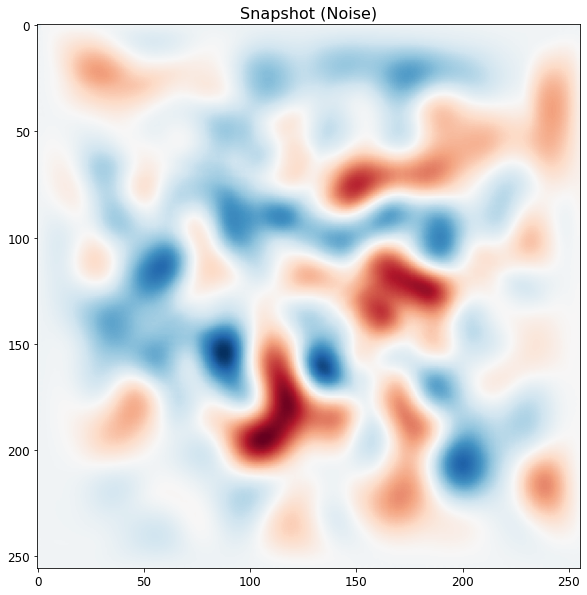

In [47]:
noise = tf.random.normal([1, latent_space])
generated_image = generator(noise, training=False)
print(generated_image.shape)

fig, ax = plt.subplots(figsize=[10,10])
inv_generated_image = invert_data(generated_image[0, :, :, 0])
print(inv_generated_image.shape)
ax.imshow(inv_generated_image[0, :].reshape(nx, nx), cmap='RdBu');
ax.set_title('Snapshot (Noise)', fontsize=16);

Discriminator / Critic

In [21]:
# Addition for WGAN implementation. 
from keras.constraints import Constraint
from keras import backend

class ClipConstraint(Constraint):
  def __init__(self, clip_value):
    self.clip_value = clip_value

  # clip value weights to hypercube
  def __call__(self, weights):
    return backend.clip(weights, -self.clip_value, self.clip_value)

  #get config 
  def get_config(self):
    return {'clip_value': self.clip_value}

In [50]:
clip_value = 0.01
def make_discriminator_model():
    # weight initialization
    init = tf.initializers.RandomNormal(stddev=0.02)
    # weight constraint
    # const = ClipConstraint(clip_value)

    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[ntimes, num_of_coeff, 1], kernel_initializer=init))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Conv2D(128, (5, 5), strides=(1, 2), padding='same', kernel_initializer=init))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Conv2D(256, (5, 5), strides=(1, 2), padding='same', kernel_initializer=init))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    # model.add(tf.keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init))
    # model.add(tf.keras.layers.LeakyReLU())
    # model.add(tf.keras.layers.Dropout(0.3))

    # model.add(tf.keras.layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init))
    # model.add(tf.keras.layers.LeakyReLU())
    # model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Flatten())
    model.add(tf.keras.layers.Dense(1))

    return model
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 4, 146, 64)        1664      
_________________________________________________________________
leaky_re_lu_27 (LeakyReLU)   (None, 4, 146, 64)        0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 4, 146, 64)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 4, 73, 128)        204928    
_________________________________________________________________
leaky_re_lu_28 (LeakyReLU)   (None, 4, 73, 128)        0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 4, 73, 128)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 4, 37, 256)       

Test disciriminator model

In [51]:
decision = discriminator(generated_image)
print(decision)

tf.Tensor([[-0.00118209]], shape=(1, 1), dtype=float32)


Gradient Penalty

In [52]:
def gradient_penalty(f, real, fake):
    
    def _interpolate(a, b):
        shape = [BATCH_SIZE, 1, 1, 1]
        alpha = tf.random.uniform(shape=shape, minval=0., maxval=1.)
        inter = a + alpha * (b - a)
        return inter

    x = _interpolate(real, fake)
    with tf.GradientTape() as t:
        t.watch(x)
        pred = f(x)
    grad = t.gradient(pred, x)
    norm = tf.norm(tf.reshape(grad, [tf.shape(grad)[0], -1]), axis=1)
    gp = tf.reduce_mean((norm - 1.)**2)

    return gp

Generative Model


In [30]:
gan = tf.keras.models.Sequential ([generator, discriminator])

Cost Function and Optimization

In [53]:

generator_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)
discriminator_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)


# Optimizers for generator and optimizer models
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=g_lr, beta_1=0., beta_2=0.9)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=d_lr, beta_1=0., beta_2=0.9)


In [54]:
# logs to document losses
#version_num = 'E3000_FT'
version_num = 'E3000_16b_wgan'

generator_log_dir = SAVE_DIR + 'logs/generator_v' + str(version_num) + '_'+ str(num_of_coeff)
discriminator_log_dir = SAVE_DIR + 'logs/discriminator_v' + str(version_num) + '_'+ str(num_of_coeff)
gen_summary = tf.summary.create_file_writer(generator_log_dir)
disc_summary = tf.summary.create_file_writer(discriminator_log_dir)


print('Version no.: ', version_num)
print('POD coeffiecients: ', num_of_coeff)
print('Batch size: ', BATCH_SIZE)
print('Learning Rate: ', g_lr, '(gen),', d_lr, '(disc)')
print('Instances: ', ntimes)
print('Time steps: ', step)

Version no.:  E3000_16b_wgan
POD coeffiecients:  292
Batch size:  16
Learning Rate:  0.0001 (gen), 0.0001 (disc)
Instances:  7
Time steps:  5


Training step

In [57]:
@tf.function
def train_step(batch, n_critic):
    noise = tf.random.normal([BATCH_SIZE, latent_space])

    # Discriminator training 
    for i in range(n_critic):
      losses_d = [] 
      with tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        
        fake_output = discriminator(generated_images, training=True)
        real_output = discriminator(batch, training=True)
        
        # Wasserstein Loss
        disc_wloss_noGP = tf.reduce_mean(fake_output) - tf.reduce_mean(real_output)
        gp = gradient_penalty(functools.partial(discriminator, training=True), batch, generated_images)
        disc_wloss = disc_wloss_noGP + gp*10.0
       
      gradients_of_discriminator = disc_tape.gradient(disc_wloss, discriminator.trainable_variables)
      discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
      losses_d.append(disc_wloss_noGP)

    discriminator_mean_loss(losses_d)

    # Generator training 
    with tf.GradientTape() as gen_tape:
        generated_images = generator(noise, training=True)
        fake_output = discriminator(generated_images, training=True)

        # Wasserstein Loss
        gen_wloss = -tf.reduce_mean(fake_output)

    gradients_of_generator = gen_tape.gradient(gen_wloss, generator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    generator_mean_loss(gen_wloss)
    return gp

**Train GAN**

In [60]:
def train(dataset, epochs, n_critic):
    hist = []
    for epoch in range(epochs+1):
        start = time.time()
        print("Epoch {}/{}".format(epoch + 1, epochs))   

        for batch in dataset:
           gp = train_step(batch, n_critic)
            
        with gen_summary.as_default():
            tf.summary.scalar('loss', generator_mean_loss.result(), step=epoch)

        with disc_summary.as_default():
            tf.summary.scalar('loss', discriminator_mean_loss.result(), step=epoch)
        
        hist.append([generator_mean_loss.result().numpy(), discriminator_mean_loss.result().numpy()])

        generator_mean_loss.reset_states()
        discriminator_mean_loss.reset_states()
        

        print("discriminator loss: ", "{:.7f}".format(hist[-1][1]), end=' - ')
        print("generator loss: ", "{:.7f}".format(hist[-1][0]), end=' - ')
        print("gradient penalty: ", "{:.7f}".format(gp), end=' - ')    
        print ('{:.0f}s'.format( time.time()-start))

        pred_time_len = 4
        # Global variables are used below
        if epoch%1000 == 0: 
            # Plot generated data
            X_generated = generator.predict(seed).reshape(-1, num_of_coeff)
            X_generated = invert_data(X_generated)
            print(X_generated.shape)
            X_generated = X_generated.reshape(num_examples_to_generate, ntimes, nx, nx)
            fig, ax = plt.subplots(num_examples_to_generate, pred_time_len, figsize=[20, 25])
            for j in range(num_examples_to_generate):
              for i in range(pred_time_len):
                im = ax.flatten()[i + (pred_time_len*j)].imshow(X_generated[j][i,:,:], cmap='RdBu')
                ax[j,i].set_xticklabels([]), ax[j,i].set_yticklabels([])
              fig.colorbar(im, ax=ax[j,:], location='right', shrink=0.8, pad=0.05)
            plt.show() 
        
            # plot loss
            print('Loss: ')
            fig, ax = plt.subplots(1,1, figsize=[20,10])
            ax.plot(hist)
            ax.legend(['loss_gen', 'loss_disc'])
            ax.set_yscale('log')
            ax.grid()
            plt.show()
                       
            # Save model once greater that 10,000 iterations 
            gan.save(SAVE_DIR + 'ganmodels/model_v'+ str(version_num) + '_'+ 
                                          str(num_of_coeff)+'_'+str(epoch)+'.h5')  
    return hist

discriminator loss:  -1.0936495 - generator loss:  -0.3086248 - gradient penalty:  0.0045975 - 15s
Epoch 1904/20000
discriminator loss:  -1.0666068 - generator loss:  -0.2936277 - gradient penalty:  0.0137509 - 15s
Epoch 1905/20000
discriminator loss:  -1.0951626 - generator loss:  -0.3115180 - gradient penalty:  0.0035520 - 15s
Epoch 1906/20000
discriminator loss:  -1.0543829 - generator loss:  -0.3201181 - gradient penalty:  0.0118422 - 15s
Epoch 1907/20000
discriminator loss:  -1.0872724 - generator loss:  -0.2752740 - gradient penalty:  0.0053971 - 15s
Epoch 1908/20000
discriminator loss:  -1.0762383 - generator loss:  -0.2226194 - gradient penalty:  0.0110938 - 15s
Epoch 1909/20000
discriminator loss:  -1.0861226 - generator loss:  -0.2054386 - gradient penalty:  0.0080339 - 15s
Epoch 1910/20000
discriminator loss:  -1.0588421 - generator loss:  -0.2409462 - gradient penalty:  0.0065218 - 15s
Epoch 1911/20000
discriminator loss:  -1.1019193 - generator loss:  -0.2843983 - gradient

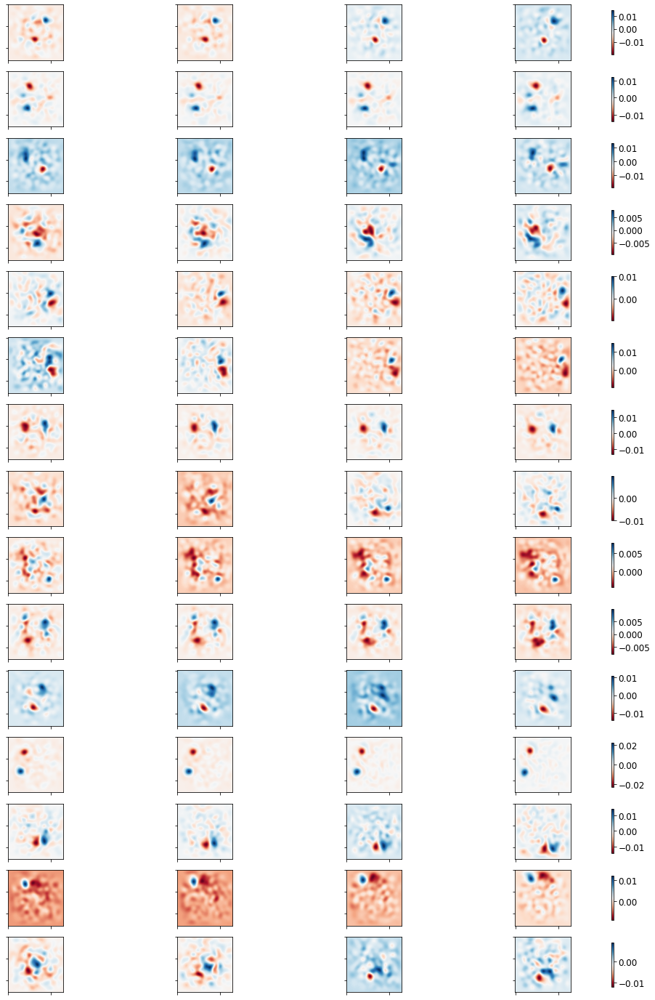

Loss: 


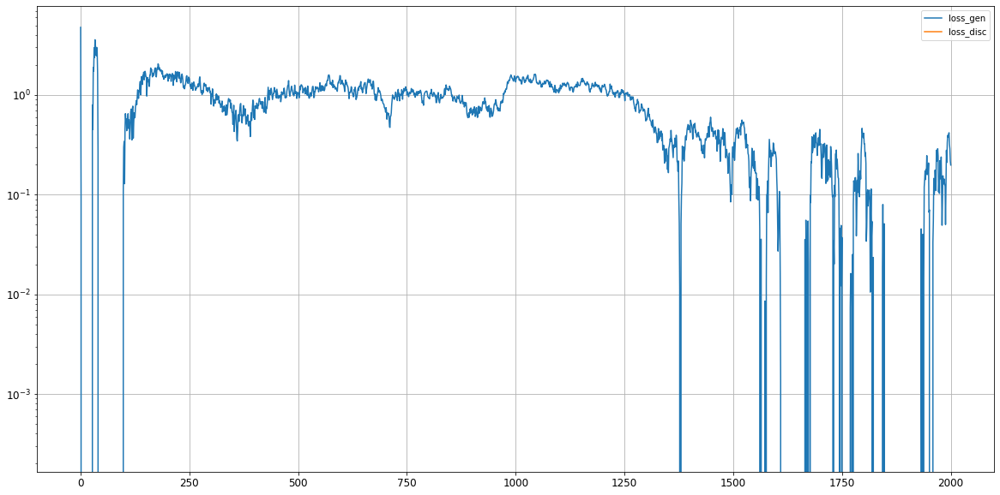

Epoch 2002/20000
discriminator loss:  -1.0623175 - generator loss:  0.2369980 - gradient penalty:  0.0086187 - 15s
Epoch 2003/20000
discriminator loss:  -1.0693257 - generator loss:  0.3414141 - gradient penalty:  0.0108480 - 15s
Epoch 2004/20000
discriminator loss:  -1.1023166 - generator loss:  0.2868477 - gradient penalty:  0.0019542 - 15s
Epoch 2005/20000
discriminator loss:  -1.0683012 - generator loss:  0.2929431 - gradient penalty:  0.0070978 - 15s
Epoch 2006/20000
discriminator loss:  -1.0694371 - generator loss:  0.2338789 - gradient penalty:  0.0078390 - 15s
Epoch 2007/20000
discriminator loss:  -1.0946498 - generator loss:  0.2778496 - gradient penalty:  0.0141191 - 15s
Epoch 2008/20000
discriminator loss:  -1.1022063 - generator loss:  0.4294096 - gradient penalty:  0.0074125 - 15s
Epoch 2009/20000
discriminator loss:  -1.0544685 - generator loss:  0.3997519 - gradient penalty:  0.0073368 - 15s
Epoch 2010/20000
discriminator loss:  -1.1006780 - generator loss:  0.3090774 - 

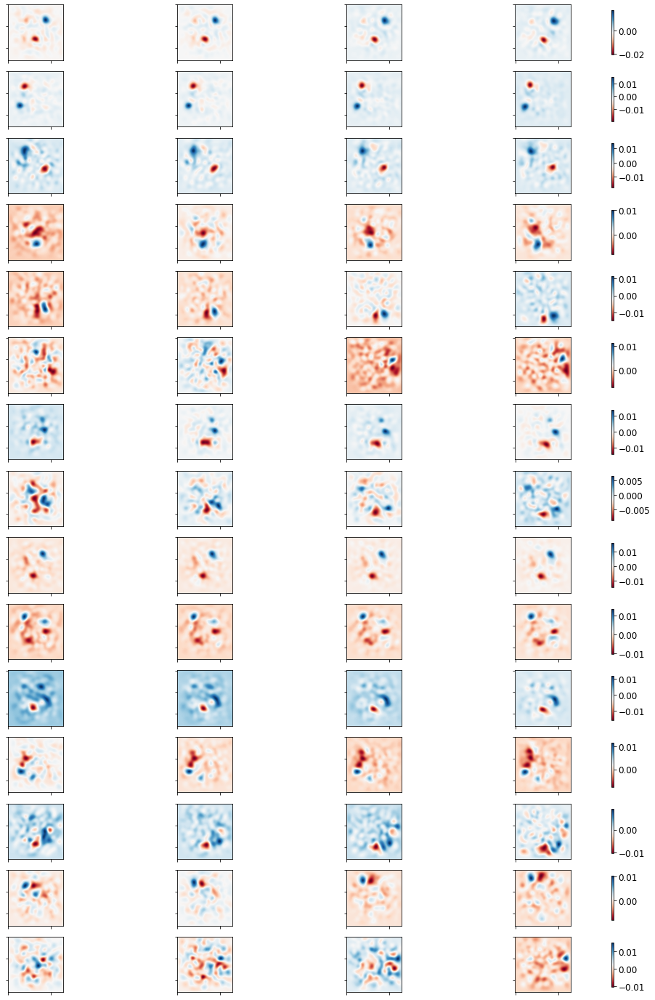

Loss: 


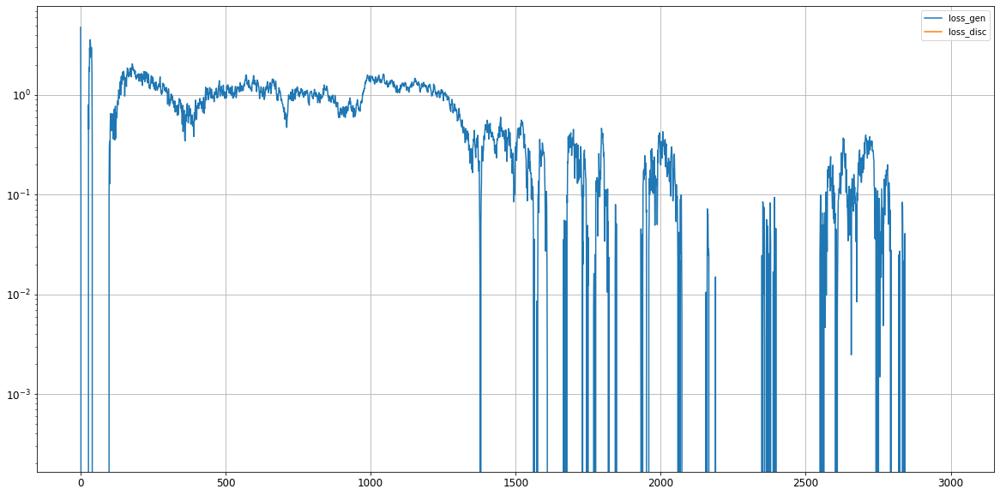

Epoch 3002/20000
discriminator loss:  -1.0178736 - generator loss:  -0.4192668 - gradient penalty:  0.0046284 - 15s
Epoch 3003/20000
discriminator loss:  -1.0444552 - generator loss:  -0.4340392 - gradient penalty:  0.0028639 - 15s
Epoch 3004/20000
discriminator loss:  -1.0409586 - generator loss:  -0.3984255 - gradient penalty:  0.0147278 - 15s
Epoch 3005/20000
discriminator loss:  -1.0129707 - generator loss:  -0.3801842 - gradient penalty:  0.0054583 - 15s
Epoch 3006/20000
discriminator loss:  -0.9906319 - generator loss:  -0.3236298 - gradient penalty:  0.0051562 - 15s
Epoch 3007/20000
discriminator loss:  -1.0360076 - generator loss:  -0.2558141 - gradient penalty:  0.0055057 - 15s
Epoch 3008/20000
discriminator loss:  -1.0342419 - generator loss:  -0.2932105 - gradient penalty:  0.0067995 - 15s
Epoch 3009/20000
discriminator loss:  -1.0555301 - generator loss:  -0.3213204 - gradient penalty:  0.0077392 - 15s
Epoch 3010/20000
discriminator loss:  -1.0414348 - generator loss:  -0.4

FailedPreconditionError: ignored

In [61]:
import time
hist = train(train_dataset, epochs=20000, n_critic=5)

### Improved DCGAN 

1. Feature Matching
2. More latent space, 64 batch size, diff LR. 

Generator Model

In [25]:
from keras import backend as K

In [12]:
def make_generator_model():

    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Dense(5*12*512, use_bias=False, input_shape=(latent_space,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU(0.3))
  

    model.add(tf.keras.layers.Reshape((5, 12, 512)))

    model.add(tf.keras.layers.Conv2DTranspose(256, (3, 7), strides=(1, 1), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU(0.3)) 

    model.add(tf.keras.layers.Conv2DTranspose(128, (3, 7), strides=(1, 2), padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU(0.3))

    model.add(tf.keras.layers.Conv2DTranspose(64, (3, 7), strides=(1, 2),  padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU(0.3))

    model.add(tf.keras.layers.Conv2DTranspose(32, (3, 7), strides=(1, 2),  padding='same', use_bias=False))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU(0.3))


    model.add(tf.keras.layers.Conv2DTranspose(1, (3, 7), strides=(1, 3),  padding ='valid', output_padding=[0,0], use_bias=False, activation='tanh'))

    return model
generator = make_generator_model()
generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 30720)             92160000  
_________________________________________________________________
batch_normalization (BatchNo (None, 30720)             122880    
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 30720)             0         
_________________________________________________________________
reshape (Reshape)            (None, 5, 12, 512)        0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 5, 12, 256)        2752512   
_________________________________________________________________
batch_normalization_1 (Batch (None, 5, 12, 256)        1024      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 5, 12, 256)        0

Testing the model generator

(1, 7, 292, 1)
(7, 65536)


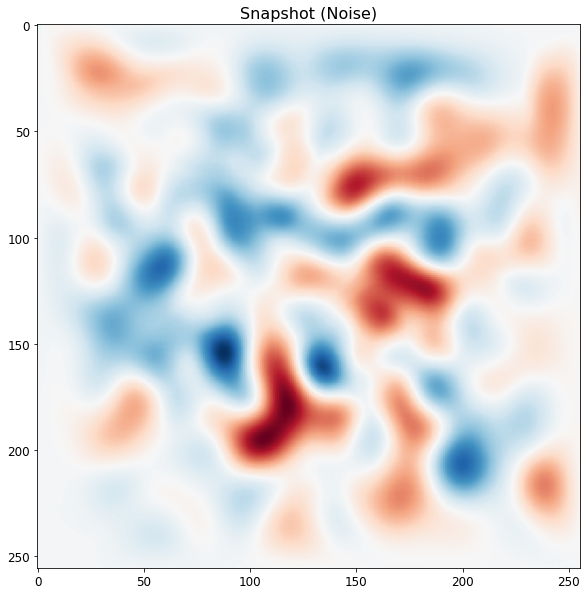

In [13]:
noise = tf.random.normal([1, latent_space])
generated_image = generator(noise, training=False)
print(generated_image.shape)

fig, ax = plt.subplots(figsize=[10,10])
inv_generated_image = invert_data(generated_image[0, :, :, 0])
print(inv_generated_image.shape)
ax.imshow(inv_generated_image[0, :].reshape(nx, nx), cmap='RdBu');
ax.set_title('Snapshot (Noise)', fontsize=16);

Discriminator

In [24]:
 from keras import backend as K
 from keras.layers import InputSpec, Layer
 from keras import initializers, regularizers, constraints

 class MinibatchDiscrimination(Layer):
    def __init__(self, nb_kernels, kernel_dim, init='glorot_uniform', weights=None,
                 W_regularizer=None, activity_regularizer=None,
                 W_constraint=None, input_dim=None, **kwargs):
        self.init = initializers.get(init)
        self.nb_kernels = nb_kernels
        self.kernel_dim = kernel_dim
        self.input_dim = input_dim

        self.W_regularizer = regularizers.get(W_regularizer)
        self.activity_regularizer = regularizers.get(activity_regularizer)

        self.W_constraint = constraints.get(W_constraint)

        self.initial_weights = weights
        self.input_spec = [InputSpec(ndim=2)]

        if self.input_dim:
            kwargs['input_shape'] = (self.input_dim,)
        super(MinibatchDiscrimination, self).__init__(**kwargs)

    def build(self, input_shape):
        assert len(input_shape) == 2

        input_dim = input_shape[1]
        self.input_spec = [InputSpec(dtype=K.floatx(),
                                     shape=(None, input_dim))]

        self.W = self.add_weight(shape=(self.nb_kernels, input_dim, self.kernel_dim),
            initializer=self.init,
            name='kernel',
            regularizer=self.W_regularizer,
            trainable=True,
            constraint=self.W_constraint)

        # Set built to true.
        super(MinibatchDiscrimination, self).build(input_shape)

    def call(self, x, mask=None):
        activation = K.reshape(K.dot(x, self.W), (-1, self.nb_kernels, self.kernel_dim))
        diffs = K.expand_dims(activation, 3) - K.expand_dims(K.permute_dimensions(activation, [1, 2, 0]), 0)
        abs_diffs = K.sum(K.abs(diffs), axis=2)
        minibatch_features = K.sum(K.exp(-abs_diffs), axis=2)
        return K.concatenate([x, minibatch_features], 1)

    def compute_output_shape(self, input_shape):
        assert input_shape and len(input_shape) == 2
        return input_shape[0], input_shape[1]+self.nb_kernels

    def get_config(self):
        config = super(MinibatchDiscrimination, self).get_config().copy()
        config.update({'nb_kernels': self.nb_kernels,
                  'kernel_dim': self.kernel_dim,
                  'init': self.__init__.__name__,
                  'W_regularizer': self.W_regularizer.get_config() if self.W_regularizer else None,
                  'activity_regularizer': self.activity_regularizer.get_config() if self.activity_regularizer else None,
                  'W_constraint': self.W_constraint.get_config() if self.W_constraint else None,
                  'input_dim': self.input_dim})
        return config

In [14]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same',
                                     input_shape=[ntimes, num_of_coeff, 1]))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(tf.keras.layers.LeakyReLU())
    model.add(tf.keras.layers.Dropout(0.3))

    model.add(tf.keras.layers.Flatten(name='feature_layer'))
    model.add(tf.keras.layers.Dense(1))

    return model
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 4, 146, 64)        640       
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 4, 146, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 4, 146, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 2, 73, 64)         102464    
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 2, 73, 64)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 2, 73, 64)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 1, 37, 64)        

Test disciriminator model

In [15]:
decision = discriminator(generated_image)
print(decision)

tf.Tensor([[-4.5392284e-05]], shape=(1, 1), dtype=float32)


Generative Model


In [16]:
gan = tf.keras.models.Sequential ([generator, discriminator])

Cost Function and Optimization

In [19]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
  total_loss = real_loss + fake_loss
  return total_loss

def generator_loss(fake_output):
  fake_loss = cross_entropy(tf.ones_like(fake_output), fake_output)
  return fake_loss

def feature_loss(fake_ft_layer, real_ft_layer):
  fake_loss = K.abs(K.mean(real_ft_layer, axis=0) - K.mean(fake_ft_layer, axis=0))
  fake_loss = K.mean(fake_loss)
  return fake_loss

generator_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)
discriminator_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)

# Optimizers for generator and optimizer models

generator_optimizer = tf.keras.optimizers.Adam(g_lr)
discriminator_optimizer = tf.keras.optimizers.Adam(d_lr)


In [20]:
# logs to document losses

generator_log_dir = SAVE_DIR + 'logs/generator_v' + str(version_num) + '_'+ str(num_of_coeff)
discriminator_log_dir = SAVE_DIR + 'logs/discriminator_v' + str(version_num) + '_'+ str(num_of_coeff)
gen_summary = tf.summary.create_file_writer(generator_log_dir)
disc_summary = tf.summary.create_file_writer(discriminator_log_dir)

print('Version no.: ', version_num)
print('POD coeffiecients: ', num_of_coeff)
print('Batch size: ', BATCH_SIZE)
print('Learning Rate: gen-', g_lr, ', disc-', d_lr)

Version no.:  E3000_FT
POD coeffiecients:  292
Batch size:  16
Learning Rate: gen- 0.0001 , disc- 0.0001


Training step

In [27]:
def train_step(batch):
    noise = tf.random.normal([BATCH_SIZE, latent_space])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        real_output = discriminator(batch, training=True)
        fake_output = discriminator(generated_images, training=True)
        
        feature_extractor = tf.keras.Model(inputs=discriminator.input, outputs=discriminator.get_layer('feature_layer').output)
        fake_features = feature_extractor(generated_images)
        real_features = feature_extractor(batch)
        gen_loss_ft = feature_loss(fake_features, real_features)

        gen_loss_orig = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
        gen_loss =  gen_loss_ft + gen_loss_orig

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    generator_mean_loss(gen_loss)
    discriminator_mean_loss(disc_loss)
    return gen_loss_orig, gen_loss_ft

Train GAN - Training loop

In [23]:
def train(dataset, epochs):
    hist = []
    for epoch in range(epochs+1):
        start = time.time()
        print("Epoch {}/{}".format(epoch + 1, epochs))   

        loss_orig, loss_ft = [], []
        for batch in dataset:
            orig_gen_loss, ft_gen_loss = train_step(batch)
            loss_orig.append(orig_gen_loss)
            loss_ft.append(ft_gen_loss)
            
        with gen_summary.as_default():
            tf.summary.scalar('loss', generator_mean_loss.result(), step=epoch)

        with disc_summary.as_default():
            tf.summary.scalar('loss', discriminator_mean_loss.result(), step=epoch)
        
        hist.append([generator_mean_loss.result().numpy(), discriminator_mean_loss.result().numpy()])

        generator_mean_loss.reset_states()
        discriminator_mean_loss.reset_states()
        print("discriminator loss: ", "{:.6f}".format(hist[-1][1]), end=' - ')
        print("generator loss: ", "{:.6f}".format(hist[-1][0]), end=' - ') 
        print (" feature loss: ", "{:.6f}".format(np.mean(loss_ft)))
        print (" orig loss: ", "{:.6f}".format(np.mean(loss_orig)))   
        print ('{:.0f}s'.format( time.time()-start))

        pred_time_len = 4
        # Global variables are used below
        if epoch%100 == 0: 
            # Plot generated data
            X_generated = generator.predict(seed).reshape(-1, num_of_coeff)
            X_generated = invert_data(X_generated)
            print(X_generated.shape)
            X_generated = X_generated.reshape(num_examples_to_generate, ntimes, nx, nx)
            fig, ax = plt.subplots(5, pred_time_len, figsize=[20, 25], constrained_layout=True)
            for j in range(5):
              for i in range(pred_time_len):
                im = ax.flatten()[i + (pred_time_len*j)].imshow(X_generated[j][i,:,:], cmap='RdBu')
                ax[j,i].set_xticklabels([]), ax[j,i].set_yticklabels([])
              fig.colorbar(im, ax=ax[j,:], location='right', shrink=0.8, pad=0.05)
            plt.show() 
                        
                
            # plot loss
            print('Loss: ')
            fig, ax = plt.subplots(1,1, figsize=[20,10])
            ax.plot(hist)
            ax.legend(['loss_gen', 'loss_disc'])
            ax.set_yscale('log')
            ax.grid()
            plt.show()
        if epoch%100 == 0:
            # Save model once greater that 10,000 iterations 
            gan.save(SAVE_DIR + 'ganmodels/model_v'+ str(version_num) + '_'+ 
                                          str(num_of_coeff)+'_'+str(epoch)+'.h5')
            
    return hist


Epoch 1/50000
discriminator loss:  1.186375 - generator loss:  1.091931 -  feature loss:  0.069242
 orig loss:  1.022689
11s
(105, 65536)


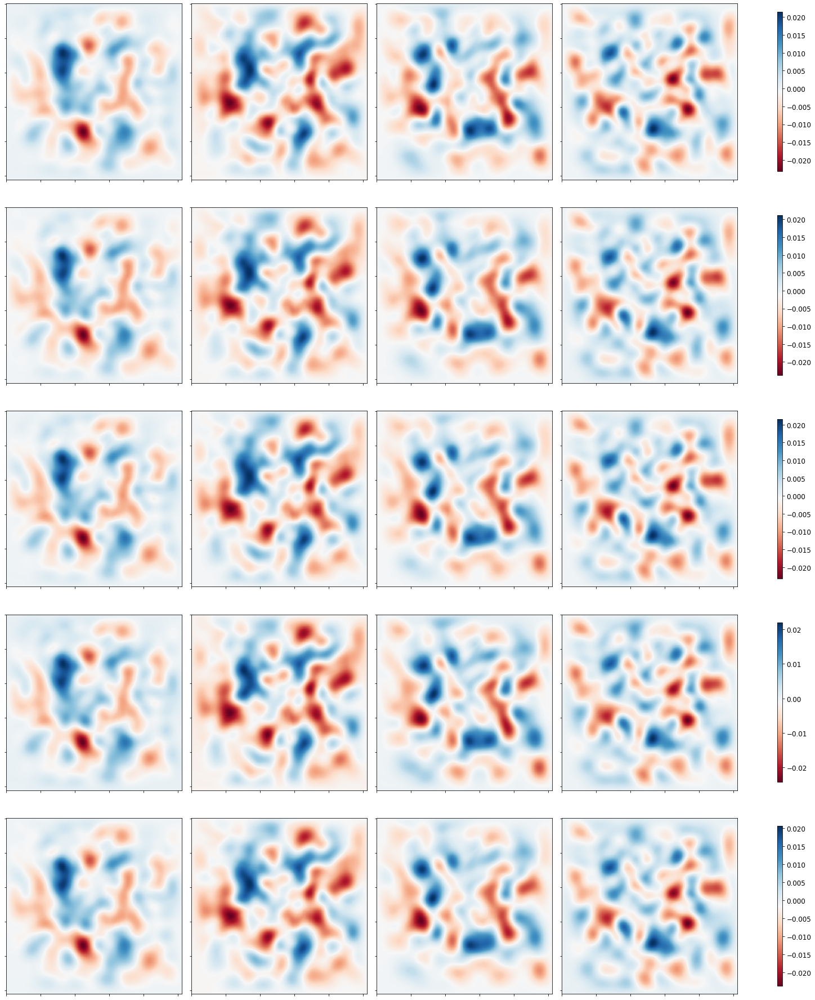

Loss: 


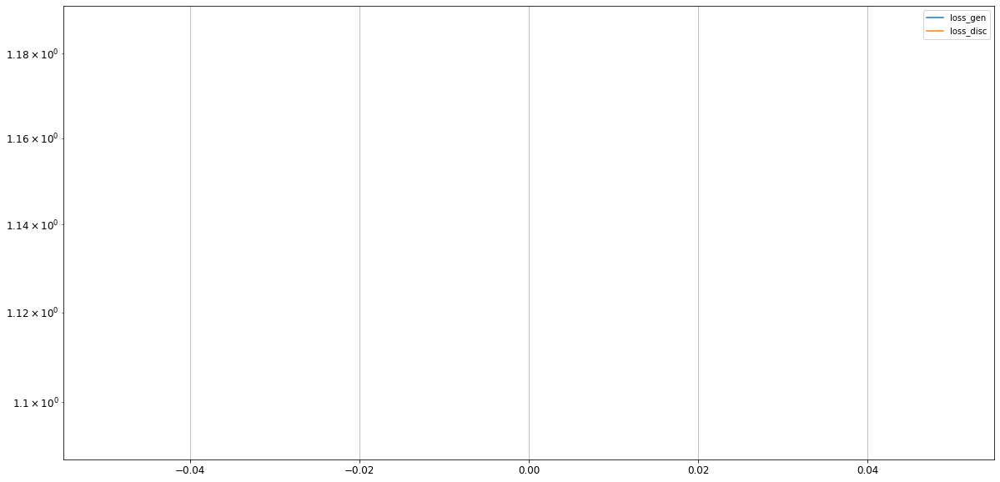

Epoch 2/50000
discriminator loss:  1.502134 - generator loss:  0.757048 -  feature loss:  0.015164
 orig loss:  0.741884
11s
Epoch 3/50000
discriminator loss:  1.353018 - generator loss:  0.861755 -  feature loss:  0.013485
 orig loss:  0.848270
11s
Epoch 4/50000
discriminator loss:  1.347967 - generator loss:  0.800266 -  feature loss:  0.004763
 orig loss:  0.795503
11s
Epoch 5/50000
discriminator loss:  1.371699 - generator loss:  0.700198 -  feature loss:  0.005136
 orig loss:  0.695061
11s
Epoch 6/50000
discriminator loss:  1.411707 - generator loss:  0.607567 -  feature loss:  0.000701
 orig loss:  0.606866
11s
Epoch 7/50000
discriminator loss:  1.375580 - generator loss:  0.712278 -  feature loss:  0.000900
 orig loss:  0.711378
10s
Epoch 8/50000
discriminator loss:  1.392034 - generator loss:  0.644949 -  feature loss:  0.000305
 orig loss:  0.644644
10s
Epoch 9/50000
discriminator loss:  1.386691 - generator loss:  0.678111 -  feature loss:  0.000269
 orig loss:  0.677843
10s


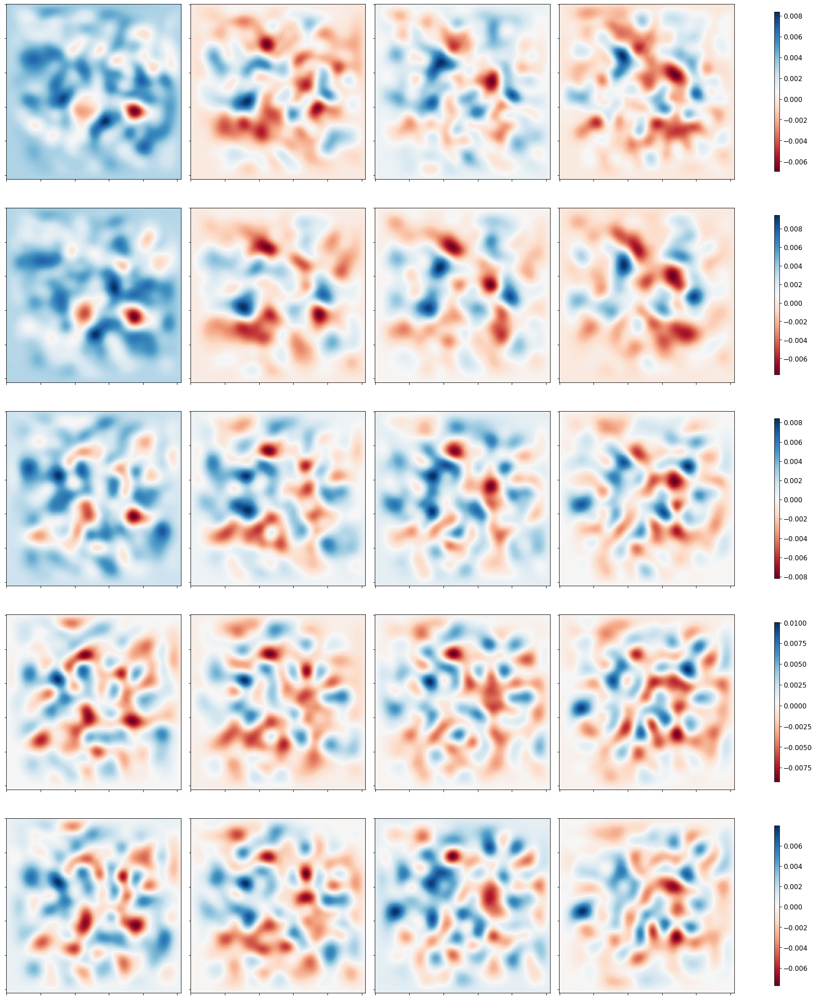

Loss: 


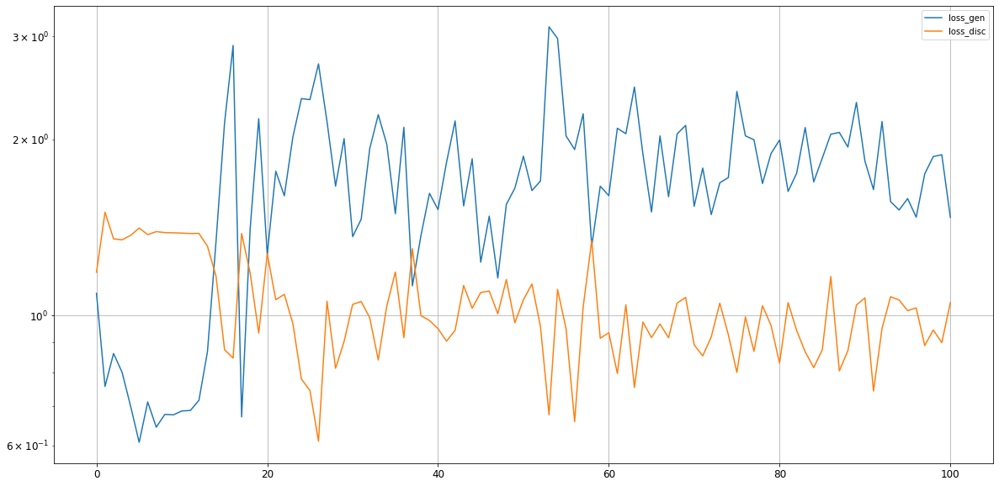

Epoch 102/50000
discriminator loss:  0.986667 - generator loss:  1.663608 -  feature loss:  0.046356
 orig loss:  1.617252
11s
Epoch 103/50000
discriminator loss:  1.014892 - generator loss:  1.428986 -  feature loss:  0.049186
 orig loss:  1.379800
11s
Epoch 104/50000
discriminator loss:  0.759025 - generator loss:  1.765746 -  feature loss:  0.051383
 orig loss:  1.714362
10s
Epoch 105/50000
discriminator loss:  0.756309 - generator loss:  1.838797 -  feature loss:  0.051176
 orig loss:  1.787621
11s
Epoch 106/50000
discriminator loss:  0.814553 - generator loss:  1.926512 -  feature loss:  0.050864
 orig loss:  1.875647
12s
Epoch 107/50000
discriminator loss:  0.859488 - generator loss:  2.063447 -  feature loss:  0.074780
 orig loss:  1.988667
11s
Epoch 108/50000
discriminator loss:  0.659242 - generator loss:  2.686187 -  feature loss:  0.092440
 orig loss:  2.593746
11s
Epoch 109/50000
discriminator loss:  0.899514 - generator loss:  1.792334 -  feature loss:  0.050285
 orig loss

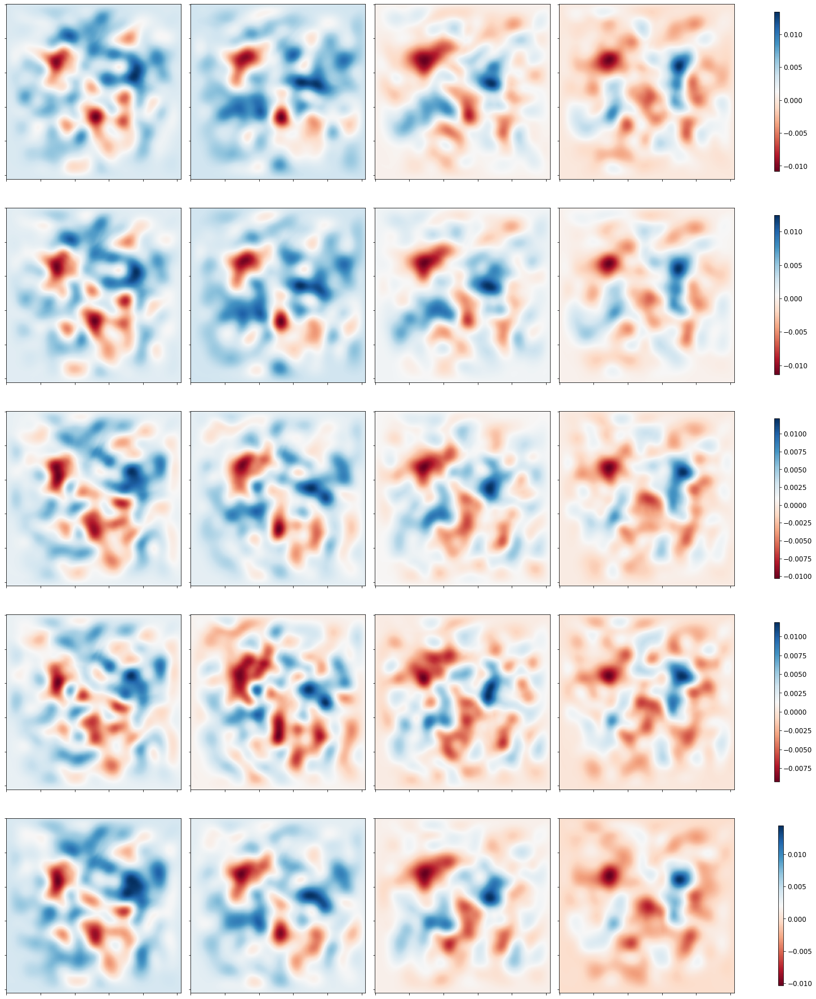

Loss: 


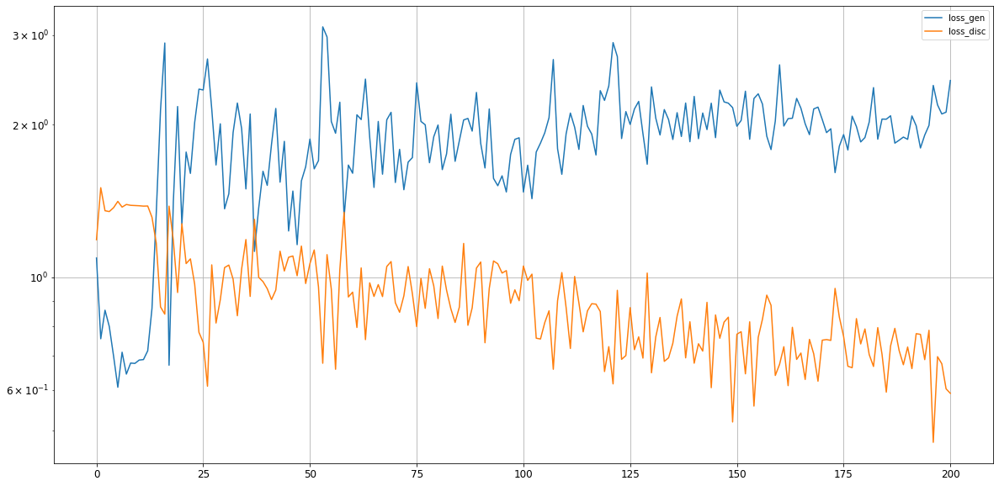

Epoch 202/50000
discriminator loss:  0.716866 - generator loss:  2.165386 -  feature loss:  0.142284
 orig loss:  2.023101
12s
Epoch 203/50000
discriminator loss:  0.637668 - generator loss:  2.129772 -  feature loss:  0.166354
 orig loss:  1.963418
11s
Epoch 204/50000
discriminator loss:  0.684655 - generator loss:  2.541921 -  feature loss:  0.299803
 orig loss:  2.242118
11s
Epoch 205/50000
discriminator loss:  0.772885 - generator loss:  1.947794 -  feature loss:  0.127242
 orig loss:  1.820551
11s
Epoch 206/50000
discriminator loss:  0.706388 - generator loss:  1.881424 -  feature loss:  0.128112
 orig loss:  1.753312
11s
Epoch 207/50000
discriminator loss:  0.585306 - generator loss:  1.969574 -  feature loss:  0.149807
 orig loss:  1.819767
11s
Epoch 208/50000


KeyboardInterrupt: ignored

In [28]:
import time
hist = train(train_dataset, epochs=50000)

### Unrolled GAN 

Generator Model

In [ ]:
def make_generator_model():
    # model = tf.keras.Sequential()
    # model.add(keras.layers.Dense(5*73*256, use_bias=False, input_shape=(latent_space,)))
    # model.add(keras.layers.BatchNormalization())
    # model.add(keras.layers.LeakyReLU())

    # model.add(keras.layers.Reshape((5, 73, 256)))

    # model.add(keras.layers.Conv2DTranspose(128, (3, 3), strides=(1, 1), padding='same', use_bias=False))
    # model.add(keras.layers.BatchNormalization())
    # model.add(keras.layers.LeakyReLU())

    # model.add(keras.layers.Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', use_bias=False))
    # model.add(keras.layers.BatchNormalization())
    # model.add(keras.layers.LeakyReLU())

    # model.add(keras.layers.Conv2DTranspose(1, (3, 3), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    
    #alt architecture
    model = tf.keras.Sequential()
    model.add(keras.layers.Dense(5*12*512, use_bias=False, input_shape=(latent_space,)))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.3))
  

    model.add(keras.layers.Reshape((5, 12, 512)))

    model.add(keras.layers.Conv2DTranspose(256, (3, 7), strides=(1, 1), padding='same', use_bias=False))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.3)) 

    model.add(keras.layers.Conv2DTranspose(256, (3, 7), strides=(1, 2), padding='same', use_bias=False))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.3))

    model.add(keras.layers.Conv2DTranspose(256, (3, 7), strides=(1, 2), padding='same', use_bias=False))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.3))

    model.add(keras.layers.Conv2DTranspose(256, (3, 7), strides=(2, 2), padding='same', use_bias=False))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.3))


    model.add(keras.layers.Conv2DTranspose(1, (3, 7), strides=(2, 3), padding ='valid', output_padding=[0,0], use_bias=False, activation='tanh'))

    return model
generator = make_generator_model()
generator.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 30720)             15360000  
_________________________________________________________________
batch_normalization_36 (Batc (None, 30720)             122880    
_________________________________________________________________
leaky_re_lu_36 (LeakyReLU)   (None, 30720)             0         
_________________________________________________________________
reshape_8 (Reshape)          (None, 5, 12, 512)        0         
_________________________________________________________________
conv2d_transpose_36 (Conv2DT (None, 5, 12, 256)        2752512   
_________________________________________________________________
batch_normalization_37 (Batc (None, 5, 12, 256)        1024      
_________________________________________________________________
leaky_re_lu_37 (LeakyReLU)   (None, 5, 12, 256)       

Testing the model generator

In [ ]:
noise = tf.random.normal([1, latent_space])
generated_image = generator(noise, training=False)
print(generated_image.shape)

fig, ax = plt.subplots(figsize=[10,10])
inv_generated_image = invert_data(generated_image[0, :, :, 0])
print(inv_generated_image.shape)
ax.imshow(inv_generated_image[0, :].reshape(nx, nx), cmap='RdBu');
ax.set_title('Snapshot (Noise)', fontsize=16);

Discriminator

In [ ]:

def make_discriminator_model():
    # model = tf.keras.Sequential()
    # model.add(keras.layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same',
    #                                  input_shape=[ntimes, num_of_coeff, 1]))
    # model.add(keras.layers.LeakyReLU())
    # model.add(keras.layers.Dropout(0.3))

    # model.add(keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    # model.add(keras.layers.LeakyReLU())
    # model.add(keras.layers.Dropout(0.3))

    # model.add(keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same'))
    # model.add(keras.layers.LeakyReLU())
    # model.add(keras.layers.Dropout(0.3))

    # model.add(keras.layers.Conv2D(32, (5, 5), strides=(2, 2), padding='same'))
    # model.add(keras.layers.LeakyReLU())
    # model.add(keras.layers.Dropout(0.3))

    # model.add(keras.layers.Conv2D(16, (5, 5), strides=(2, 2), padding='same'))
    # model.add(keras.layers.LeakyReLU())
    # model.add(keras.layers.Dropout(0.3))

    # model.add(keras.layers.Flatten())
    # model.add(keras.layers.Dense(1, activation='sigmoid'))

    model = tf.keras.Sequential()
    model.add(keras.layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',
                                     input_shape=[ntimes, num_of_coeff, 1]))
    model.add(keras.layers.LeakyReLU())
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(keras.layers.LeakyReLU())
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(keras.layers.LeakyReLU())
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(keras.layers.LeakyReLU())
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(keras.layers.LeakyReLU())
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(1))

    return model
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 11, 146, 64)       1664      
_________________________________________________________________
leaky_re_lu_41 (LeakyReLU)   (None, 11, 146, 64)       0         
_________________________________________________________________
dropout (Dropout)            (None, 11, 146, 64)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 6, 73, 128)        204928    
_________________________________________________________________
leaky_re_lu_42 (LeakyReLU)   (None, 6, 73, 128)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 6, 73, 128)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 3, 37, 128)       

Test disciriminator model

In [ ]:
decision = discriminator(generated_image)
print(decision)

tf.Tensor([[-2.9997556e-05]], shape=(1, 1), dtype=float32)


Generative Model


In [ ]:
gan = keras.models.Sequential ([generator, discriminator])

Cost Function and Optimization

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
  total_loss = real_loss + fake_loss
  return total_loss

def generator_loss(fake_output):
  fake_loss = cross_entropy(tf.ones_like(fake_output), fake_output)
  return fake_loss

generator_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)
discriminator_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)

# Optimizers for generator and optimizer models

generator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr)


In [ ]:
# logs to document losses

generator_log_dir = SAVE_DIR + 'logs/generator_v' + str(version_num) + '_'+ str(num_of_coeff)
discriminator_log_dir = SAVE_DIR + 'logs/discriminator_v' + str(version_num) + '_'+ str(num_of_coeff)
gen_summary = tf.summary.create_file_writer(generator_log_dir)
disc_summary = tf.summary.create_file_writer(discriminator_log_dir)

print('Version no.: ', version_num)
print('POD coeffiecients: ', num_of_coeff)
print('Batch size: ', BATCH_SIZE)
print('Learning Rate: ', lr)

Version no.:  altB500
POD coeffiecients:  292
Batch size:  128
Learning Rate:  0.0001


Training step

In [ ]:
@tf.function
def train_step(batch):
    noise = tf.random.normal([BATCH_SIZE, latent_space])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        real_output = discriminator(batch, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    generator_mean_loss(gen_loss)
    discriminator_mean_loss(disc_loss)

Training loop

In [ ]:
def train(dataset, epochs):
    hist = []
    for epoch in range(epochs+1):
        start = time.time()
        print("Epoch {}/{}".format(epoch + 1, epochs))   

        for batch in dataset:
            train_step(batch)
            
        with gen_summary.as_default():
            tf.summary.scalar('loss', generator_mean_loss.result(), step=epoch)

        with disc_summary.as_default():
            tf.summary.scalar('loss', discriminator_mean_loss.result(), step=epoch)
        
        hist.append([generator_mean_loss.result().numpy(), discriminator_mean_loss.result().numpy()])

        generator_mean_loss.reset_states()
        discriminator_mean_loss.reset_states()
        print("discriminator loss: ", "{:.6f}".format(hist[-1][1]), end=' - ')
        print("generator loss: ", "{:.6f}".format(hist[-1][0]), end=' - ')    
        print ('{:.0f}s'.format( time.time()-start))

        pred_time_len = 4
        # Global variables are used below
        if epoch%1000 == 0: 
            # Plot generated data
            X_generated = generator.predict(seed).reshape(-1, num_of_coeff)
            X_generated = invert_data(X_generated)
            print(X_generated.shape)
            X_generated = X_generated.reshape(num_examples_to_generate, ntimes, nx, nx)
            fig, ax = plt.subplots(num_examples_to_generate, pred_time_len, figsize=[20, 25], constrained_layout=True)
            for j in range(num_examples_to_generate):
              for i in range(pred_time_len):
                im = ax.flatten()[i + (pred_time_len*j)].imshow(X_generated[j][i,:,:], cmap='RdBu')
                ax[j,i].set_xticklabels([]), ax[j,i].set_yticklabels([])
              fig.colorbar(im, ax=ax[j,:], location='right', shrink=0.8, pad=0.05)
            plt.show() 
                    
            # Save model
            if epoch >= 10000:  
              gan.save(SAVE_DIR + 'ganmodels/model_v'+ str(version_num) + '_'+ 
                                        str(num_of_coeff)+'_'+str(epoch)+'.h5')    
            # plot loss
            print('Loss: ')
            fig, ax = plt.subplots(1,1, figsize=[20,10])
            ax.plot(hist)
            ax.legend(['loss_gen', 'loss_disc'])
            ax.set_yscale('log')
            ax.grid()
            plt.show()
            
    return hist


In [ ]:
import time
hist = train(train_dataset, epochs=50000)

#Prediction with GAN

### Sample generation

In [62]:
from tensorflow.keras.models import load_model
generator, discriminator = load_model(SAVE_DIR+'ganmodels/model_vE3000_16b_wgan_292_3000.h5').layers

np.random.seed(0)
tf.random.set_seed(0)

In [ ]:
npredict = 50
latent_size = 3000
pred_time_len = 7
noise = tf.random.normal(shape=[npredict, latent_size])
X_generated = generator.predict(noise).reshape(-1, num_of_coeff)
X_generated = invert_data(X_generated)
print(X_generated.shape)
X_generated = X_generated.reshape(npredict, ntimes, nx, nx)

for j in range(npredict):
  fig, ax = plt.subplots(1, pred_time_len, figsize=[20, 16], constrained_layout=True)
  for i in range(pred_time_len):
    im = ax.flatten()[i].imshow(X_generated[j][i,:,:], cmap='RdBu')
    ax[i].set_xticklabels([]), ax[i].set_yticklabels([])
  fig.colorbar(im, ax=ax[:], location='right', shrink=0.18, pad=0.05)
  plt.show() 

### Predict a point in time

In [64]:
weight = tf.constant(pca.singular_values_, dtype=tf.float32)

In [65]:
codings_size = num_of_coeff
mse = tf.keras.losses.MeanSquaredError()
mae = tf.keras.losses.MeanAbsoluteError()
optimizer = tf.keras.optimizers.Adam(2e-4)

def mse_loss(inp, outp, loss_weight):
    inp = tf.reshape(inp, [-1, codings_size]) #*tf.math.sqrt(loss_weight)
    outp = tf.reshape(outp, [-1, codings_size]) # *tf.math.sqrt(loss_weight)
    return mse(inp, outp)

def mae_loss(inp, outp, loss_weight):
    inp = tf.reshape(inp, [-1, codings_size])*loss_weight
    outp = tf.reshape(outp, [-1, codings_size])*loss_weight
    return mae(inp, outp)

In [66]:
@tf.function
def opt_step(latent_values, real_coding, loss_weight):
    with tf.GradientTape() as tape:
        tape.watch(latent_values)
        gen_output = generator(latent_values, training=False)  #results from generator
        loss = mae_loss(real_coding, gen_output[:,:(ntimes - 1),:,:], loss_weight)   
        #codings_size is size of each output, ntimes is number of time levels. 
        #If training for 9 time levels, it finds the loss between the first 8 outputs from the generator and 8 real outputs

    gradient = tape.gradient(loss, latent_values)   #gradient of the loss ws to the input
    optimizer.apply_gradients(zip([gradient], [latent_values]))   #applies gradients to the input
    
    return loss

In [67]:
def optimize_coding(real_coding, loss_weight, opt_epochs):
    latent_values = tf.random.normal([len(real_coding), latent_size])  
    latent_values = tf.Variable(latent_values)     #make input a tensorflow variable so it can be trained
    
    loss = []
    step_loss = 1
    opt_num = 0
    # while step_loss > 0.05:
    for epoch in range(opt_epochs):
        step_loss = opt_step(latent_values, real_coding, loss_weight).numpy()
        loss.append(step_loss)
        opt_num += 1
        
    plt.plot(loss)
    plt.grid()
    plt.show
        
    return latent_values, opt_num  #returns the optimized input that generates the desired output

In [ ]:
n = 500 # arbitrary sample
opt_epochs = 150000
print(X_train_concat_flatten.shape)
real_coding = X_train_concat_flatten[n].reshape(1,-1)
print(real_coding.shape)
real_coding = real_coding[:,:codings_size*(ntimes - 1)]
print(real_coding.shape)
real_coding = tf.constant(real_coding)  
real_coding = tf.cast(real_coding, dtype=tf.float32)
latent_values, opt_num = optimize_coding(real_coding, weight, opt_epochs)
print('MSE Loss: ', mse_loss(generator(latent_values)[:,:(ntimes - 1),:,:], real_coding, weight).numpy())
print('MAE Loss: ', mae_loss(generator(latent_values)[:,:(ntimes - 1),:,:], real_coding, weight).numpy())
print(opt_num)
# print(latent_values)

In [ ]:
X_gen = generator.predict(np.asarray(latent_values)).reshape(ntimes,codings_size)
X_gen = invert_data(X_gen)
print(X_gen.shape)
X_gen = X_gen.reshape(ntimes, nx*nx)

(21, 65536)


In [ ]:
X_real = X_train_concat_flatten[n].reshape(ntimes, codings_size)
X_real = invert_data(X_real)
print(X_real.shape)
X_real = X_real.reshape(ntimes, nx*nx)

(21, 65536)


**Generated Data**

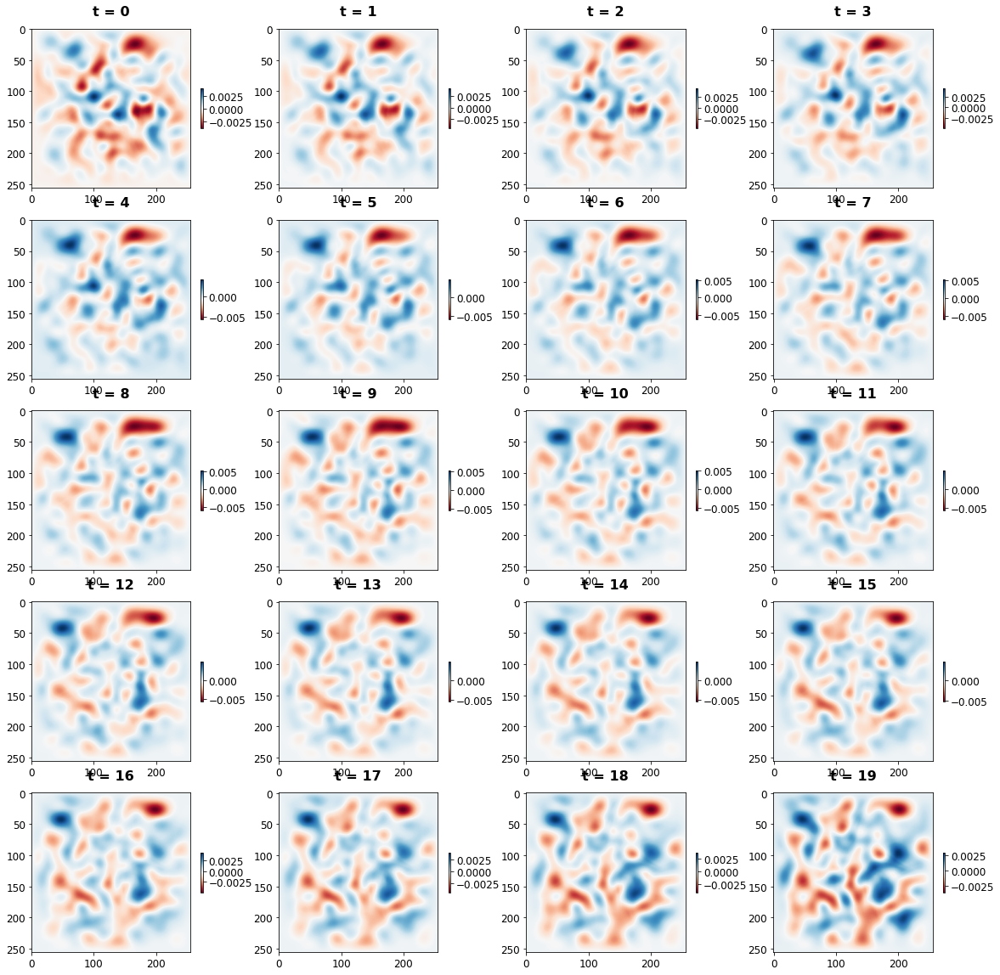

In [ ]:
times = [i for i in range(ntimes-1)]
plot_vortex(X_gen.reshape(ntimes, nx, nx), times, 4, 5)

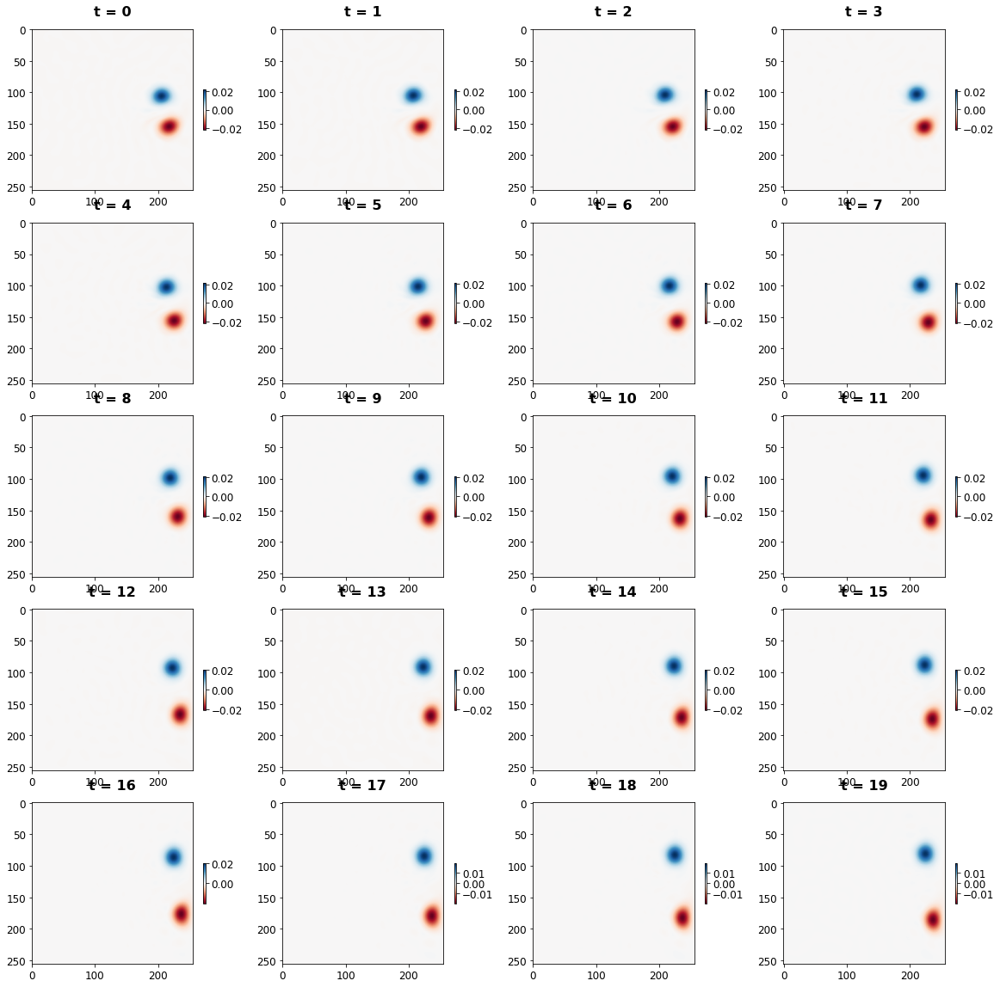

In [ ]:
plot_vortex(X_real.reshape(ntimes, nx, nx), times, 4, 5)

**Real Data**

**Comparing Predicted and Real Data for 20th timestep**

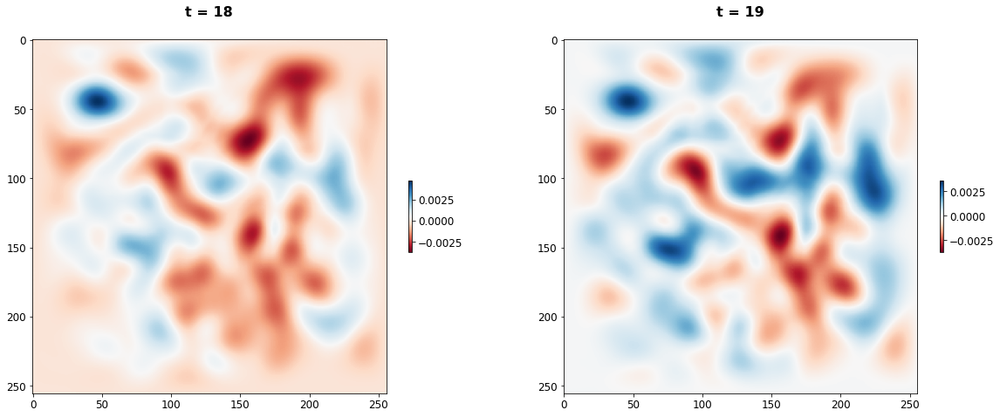

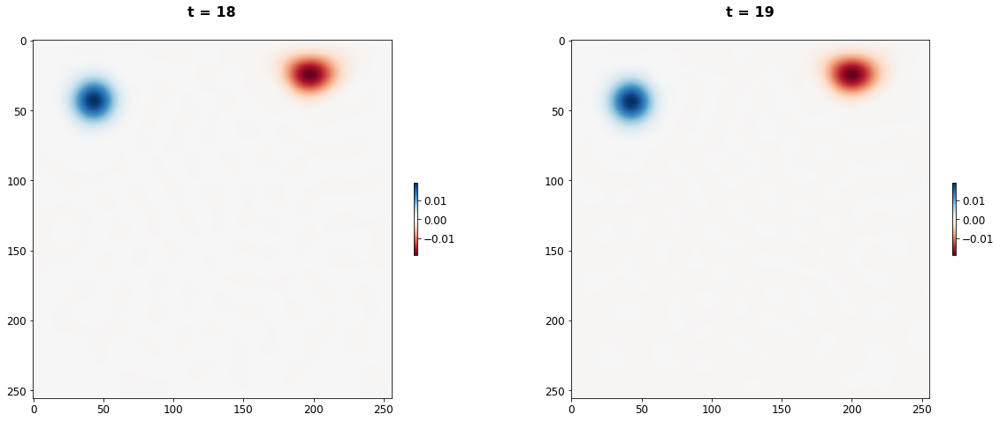

In [ ]:
plot_vortex(X_gen.reshape(ntimes, nx, nx), [ntimes-2, ntimes-1], 2)
plot_vortex(X_real.reshape(ntimes, nx, nx), [ntimes-2, ntimes-1],2)

Mean Error:  2.79743400819067e-07
Max. Error:  0.01665455403395367


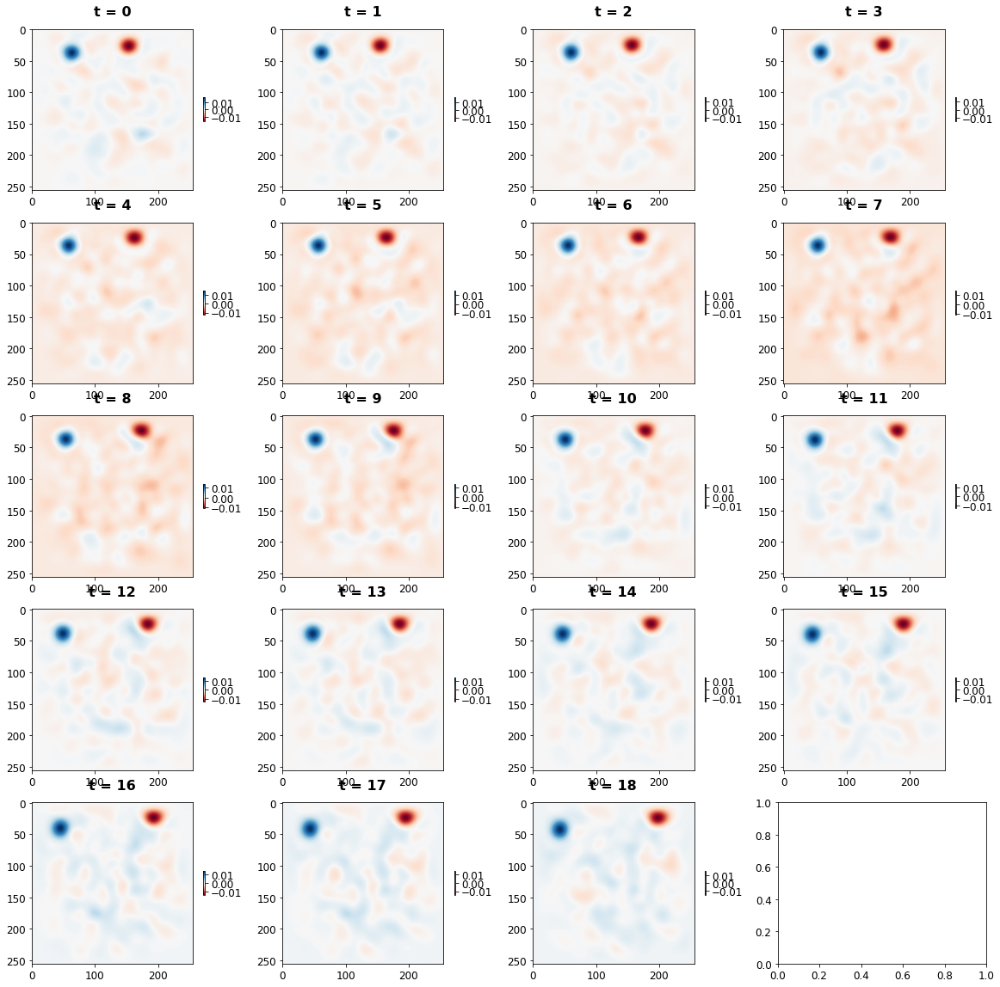

In [ ]:
real = X_real.reshape(ntimes, nx, nx)
generated = X_gen.reshape(ntimes, nx, nx)
X_diff = real - generated
print('Mean Error: ', np.mean(X_diff))
print('Max. Error: ', np.max(X_diff))
plot_vortex(X_diff, times, 4, 5)

# Variational Autoencoder for Time Series Prediction (Not Completed)

In [ ]:
class CVAE(tf.keras.Model):
  """Convolutional variational autoencoder."""

  def __init__(self, latent_dim):
    super(CVAE, self).__init__()
    self.latent_dim = latent_dim
    self.encoder = tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(28, 28, 1)),
            tf.keras.layers.Conv2D(
                filters=32, kernel_size=3, strides=(2, 2)),
            tf.keras.layers.LeakyReLU(0.3),
            tf.keras.layers.Conv2D(
                filters=64, kernel_size=3, strides=(2, 2)),
            tf.keras.layers.LeakyReLU(0.3),
            tf.keras.layers.Flatten(),
            # No activation
            tf.keras.layers.Dense(latent_dim + latent_dim),
        ]
    )

    self.decoder = tf.keras.Sequential(
        [
            tf.keras.layers.InputLayer(input_shape=(latent_dim,)),
            tf.keras.layers.Dense(units=7*7*32, activation=tf.nn.relu),
            tf.keras.layers.Reshape(target_shape=(7, 7, 32)),
            tf.keras.layers.Conv2DTranspose(
                filters=64, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            tf.keras.layers.Conv2DTranspose(
                filters=32, kernel_size=3, strides=2, padding='same',
                activation='relu'),
            # No activation
            tf.keras.layers.Conv2DTranspose(
                filters=1, kernel_size=3, strides=1, padding='same'),
        ]
    )

    @tf.function
    def sample(self, eps=None):
      if eps is None:
        eps = tf.random.normal(shape=(100, self.latent_dim))
      return self.decode(eps, apply_sigmoid=True)

    def encode(self, x):
      mean, logvar = tf.split(self.encoder(x), num_or_size_splits=2, axis=1)
      return mean, logvar

    def reparameterize(self, mean, logvar):
      eps = tf.random.normal(shape=mean.shape)
      return eps * tf.exp(logvar * .5) + mean

    def decode(self, z, apply_sigmoid=False):
      logits = self.decoder(z)
      if apply_sigmoid:
        probs = tf.sigmoid(logits)
        return probs
      return logits

**Define Loss Function and Optimizer**

In [ ]:
optimizer = tf.keras.optimizers.Adam(1e-4)


def log_normal_pdf(sample, mean, logvar, raxis=1):
  log2pi = tf.math.log(2. * np.pi)
  return tf.reduce_sum(
      -.5 * ((sample - mean) ** 2. * tf.exp(-logvar) + logvar + log2pi),
      axis=raxis)


def compute_loss(model, x):
  mean, logvar = model.encode(x)
  z = model.reparameterize(mean, logvar)
  x_logit = model.decode(z)
  cross_ent = tf.nn.sigmoid_cross_entropy_with_logits(logits=x_logit, labels=x)
  logpx_z = -tf.reduce_sum(cross_ent, axis=[1, 2, 3])
  logpz = log_normal_pdf(z, 0., 0.)
  logqz_x = log_normal_pdf(z, mean, logvar)
  return -tf.reduce_mean(logpx_z + logpz - logqz_x)


@tf.function
def train_step(model, x, optimizer):
  # computes the loss and gradients, and uses the latter to update the model's parameters.

  with tf.GradientTape() as tape:
    loss = compute_loss(model, x)
  gradients = tape.gradient(loss, model.trainable_variables)
  optimizer.apply_gradients(zip(gradients, model.trainable_variables))